# Advanced Lane Finding

## Project 4 - Self Driving Car Nanodegree

In the first project for this nanodegree a simple approach to finding lane lines was used. Canny edge detection, Hough transforms, and linear regression were used to accomplish the task of finding approximately where the lane lines in the provided sample video were. 

For this project, an approach that relies on more advanced methods is used. These approaches are:
- calibrating the camera
- correcting distortion
- using color transforms and gradients to create a threshold binary image
- applying perspective transforms
- increasing the order of the model using to detect the curvature of the lane lines

The pipeline that will be built on these methods is as follows:
1. Compute the camera calibration matrix and determine the distortion coefficients based on chessboard images.
2. Apply the distortion correction to the raw images.
3. Use the color and gradient thresholding to create a binary image.
4. Apply a perspective transform to aid in determine the curvature of the lane lines. 
5. Detect the lane line pixels and then the entire lane line.
6. Determine the curvature of each (left and right) lane line and the vehicle position with respect to the center of the lane.
7. Display the identified lane lines on the original images and combine to create a video with the estimated curvature and vehicle offset from center. 

First, the required packages need to be imported.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import matplotlib.gridspec as gridspec
import glob
import cv2
from IPython.display import HTML
from collections import deque
from moviepy.editor import VideoFileClip

%matplotlib inline

In [2]:
cv2.__version__

'3.1.0'

### Calibrate camera and correct distortion

From the classroom:
>Image distortion occurs when a camera looks at 3D objects in the real world and transforms them into a 2D image; this transformation isn’t perfect. Distortion actually changes what the shape and size of these 3D objects appear to be. So, the first step in analyzing camera images, is to undo this distortion so that you can get correct and useful information out of them.

Now, we'll calibrate the images and correct for distortion using the cv2 packages findChessboardCorners(), drawChessboardCorners(), calibrateCamera(), and undistort().

In [28]:
def calibrate(path='./camera_cal/calibration*.jpg'):
    objpoints = [] # 3D points in real world space
    imgpoints = [] # 2D points in image plane
    calibration_success = []
    
    # Prepare object points, (0,0,0), (1,0,0), (2,0,0)...(8,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # x, y coordinates. 
                                                   # mgrid creates the matrices
                                                   # then .T transposes them and .reshape(-1,2)
                                                   # reshapes them into a 54x2 matrix
    # Make a list of calibration images
    images = glob.glob(path)
    # Step through the list and search for chessboard corners
    for fname in images:
        image = cv2.imread(fname)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
#         print( 'Corner Found:', ret, 'for', path)
        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            cv2.drawChessboardCorners(image, (9, 6), corners, ret)
            calibration_success.append(image)
    return objpoints, imgpoints

def calibrate_and_undistort(image, objpoints, imgpoints):
    """
    Calibrates and undistorts images.

    Parameters
    ----------
    images        : images to be calibrated
    objpoints     : 3D points in real world space from calibrate()
    imgpoints     : 2D point in image plane from calibrate()

    Return
    ------
    Undistorted image
    """
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, (image.shape[1], image.shape[0]),None,None)
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    return undistorted

Corner Found: False for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: False for ./camera_cal/calibration*.jpg
Corner Found: False for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibration*.jpg
Corner Found: True for ./camera_cal/calibra

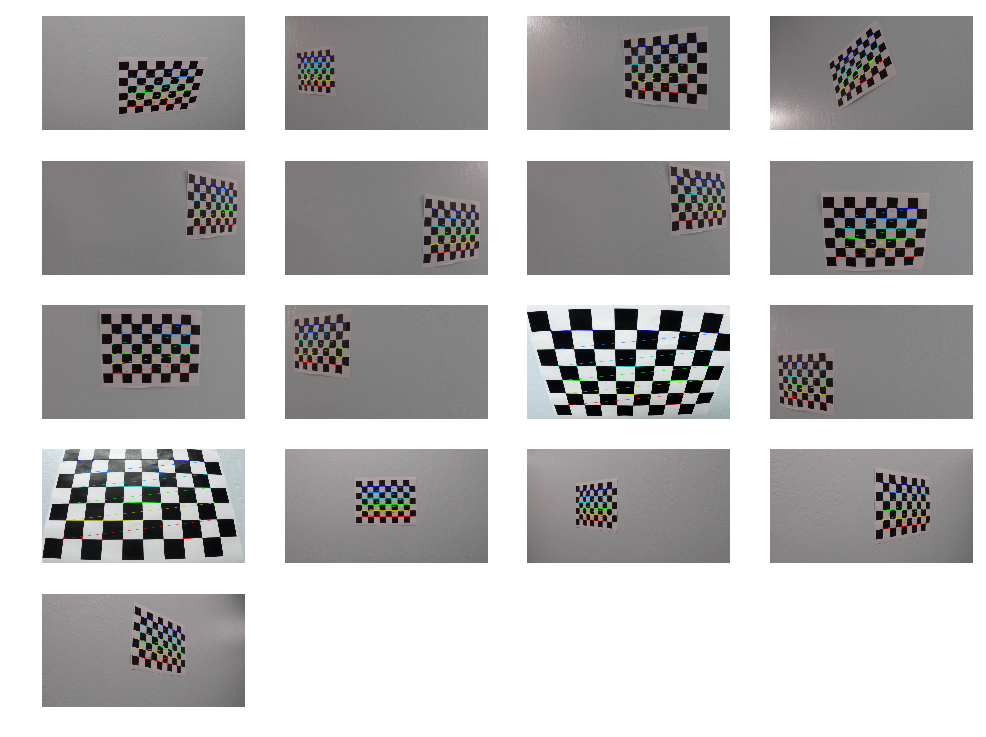

In [4]:
objpoints, imgpoints, calibration_success = calibrate('./camera_cal/calibration*.jpg')

print('\n')
print('Images with successfully detected corners:')
plt.figure(figsize = (12, 9))
gridspec.GridSpec(5, 4)

# Only plot images that successfully detected corners
for i, image in enumerate(calibration_success):
    plt.subplot2grid((5, 4), (i // 4, i % 4), colspan=1, rowspan=1)
    plt.imshow(image)
    plt.axis('off')
plt.show()

Test camera calibration on the provided test images.

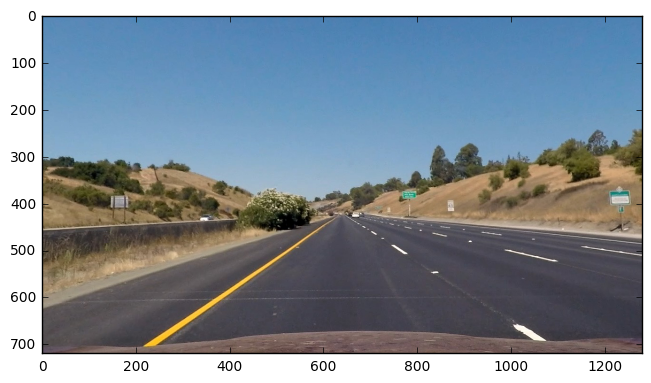

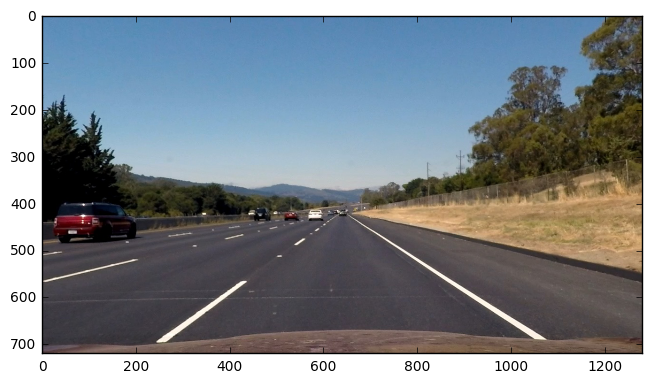

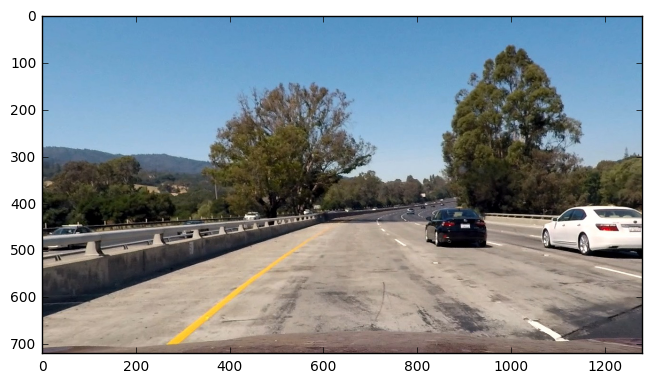

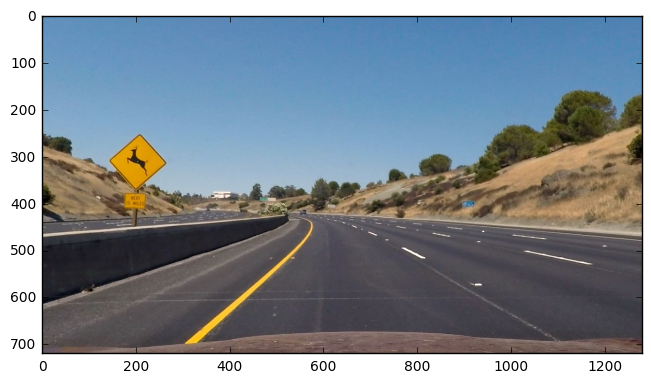

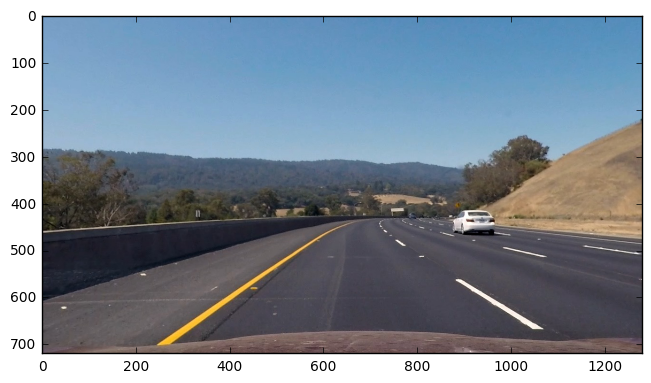

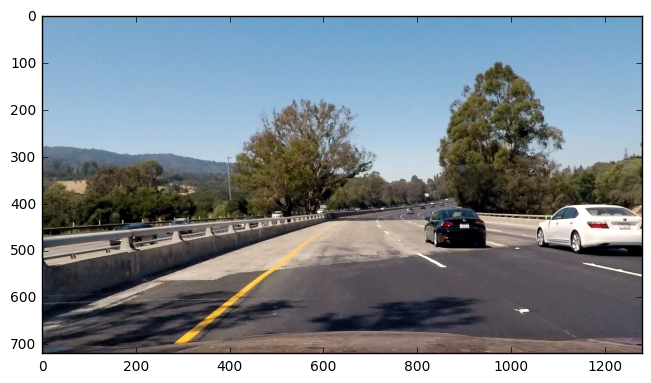

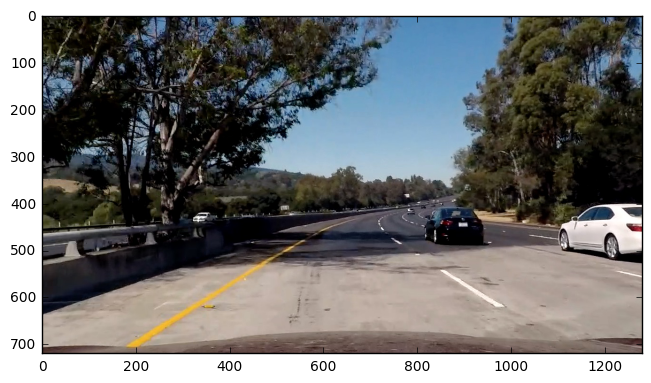

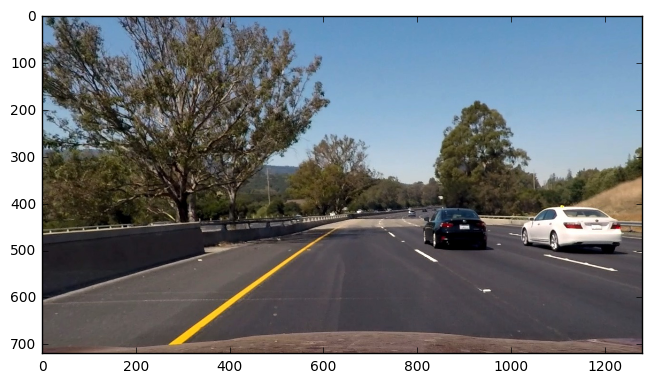

In [5]:
for image_name in glob.glob('test_images/*.jpg'):
    calibrated = calibrate_and_undistort(mpimg.imread(image_name), objpoints, imgpoints)
    plt.imshow(calibrated)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

### Color and Gradient Thresholding 

We were shown several different methods to detect the lane lines in an image. At the heart of these methods is the Sobel operator. Applying the Sobel operator allows us to take the derivative of the image in the x or y direction. Using different combinations of the Sobel operator we can mask the input images based on the gradient absolute value, gradient direction, and gradient magnitude. By combining these different masks we can isolate the lane lines in each image. Applying a color mask afterwards further emphasizes the lane lines.

In [6]:
def gradient_absolute_mask(image, sobel_kernel = 3, axis = 'x', thresh = (0,255)):
    """
    This functions masks the input image based on the absolute value of the gradient.
    
    Parameters
    ----------
    image        : input image to apply mask
    sobel_kernel : kernel for the Sobel gradient
    axis         : axis of the gradient, either 'x' or 'y'
    thresh       : threshold for what values should appear in the mask
    
    Return
    ------
    mask         : image mask
    """
    # Take the absolute value of the derivative in the direction specified
    if axis == 'x':
        sobel = np.absolute(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = sobel_kernel))
    elif axis == 'y':
        sobel = np.absolute(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = sobel_kernel))
    else:
        raise NameError('Please choose a direction (x or y).')
        
    # Scale to 8-bit and convert to np.uint8
    scaled_sobel = np.uint8(255 * sobel / np.max(sobel))
    
    # Create the threshold 
    mask = np.zeros_like(scaled_sobel)
    mask[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return mask

def gradient_direction_mask(image, sobel_kernel = 3, thresh = (0,np.pi/2)):
    """
    This functions masks the input image based on the direction of the gradient.
    
    Parameters
    ----------
    image        : input image to apply mask
    sobel_kernel : kernel for the Sobel gradient
    thresh       : threshold for what values should appear in the mask
    
    Return
    ------
    mask         : image mask
    """
    # Take the absolute value of the x and y gradients and compute the direction of the gradient
    sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    direction = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    
    # Create the threshold 
    mask = np.zeros_like(direction)
    mask[(direction >= thresh[0]) & (direction <= thresh[1])] = 1
    
    return mask

def gradient_magnitude_mask(image, sobel_kernel = 3, thresh = (0,255)):
    """
    This functions masks the input image based on the magnitude of the gradient.
    
    Parameters
    ----------
    image        : input image to apply mask
    sobel_kernel : kernel for the Sobel gradient
    thresh       : threshold for what values should appear in the mask
    
    Return
    ------
    mask         : image mask
    """
    # Take the absolute value of the x and y gradients and compute the magnitude of the gradient
    sobelx = np.absolute(cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize = sobel_kernel))
    sobely = np.absolute(cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize = sobel_kernel))
    magnitude = np.sqrt(sobelx**2 + sobely**2)
    
    # Scale to 8-bit and convert to np.uint8
    scale = np.max(magnitude) / 255
    magnitude = (magnitude / scale).astype(np.uint8)
    
    # Create the threshold 
    mask = np.zeros_like(magnitude)
    mask[(magnitude >= thresh[0]) & (magnitude <= thresh[1])] = 1
    
    return mask

def gradient_combined(image):
    """
    This functions combines the absolute, magnitude, and direction threshold
    masks.
    
    Parameters
    ----------
    image                 : input image to apply mask
    
    Return
    ------
    gradient_mask         : combined image mask
    """
    
    gradientx = gradient_absolute_mask(image, sobel_kernel = 5, axis = 'x', thresh = (20,100))
    gradienty = gradient_absolute_mask(image, sobel_kernel = 5, axis = 'y', thresh = (20,100))
    gradient_mag = gradient_magnitude_mask(image, sobel_kernel = 5, thresh = (30,150))
    gradient_dir = gradient_direction_mask(image, sobel_kernel = 5, thresh = (0.7,1.3))

    # create combined gradient mask
    gradient_mask = np.zeros_like(gradient_mag)
    gradient_mask[((gradientx == 1) & (gradienty == 1)) | ((gradient_mag == 1) & (gradient_dir == 1))] = 1

    return gradient_mask

def color_mask(image, h_thresh=(0, 255), s_thresh=(0, 255), v_thresh=(0, 255)):
    """
    This functions masks the input image based on the HSV color intensity.
    
    Parameters
    ----------
    image                : input image to apply mask
    h_thresh             : threshold for what hue values should appear in the mask
    s_thresh             : threshold for what saturation values should appear in the mask
    v_thresh             : threshold for what lightness values should appear in the mask
    
    Return
    ------
    color_binary         : image mask
    """

    # Convert to HSV color space and separate channel
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV).astype(np.float)
    h_channel = hsv[:, :, 0]
    s_channel = hsv[:, :, 1]
    v_channel = hsv[:, :, 2]

    # Threshold color channel
    color_binary = np.zeros_like(s_channel)
    color_binary[((s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])) &
                ((h_channel >= h_thresh[0]) & (h_channel <= h_thresh[1])) &
                ((v_channel >= v_thresh[0]) & (v_channel <= v_thresh[1]))] = 1
    
    return color_binary

Now define a function that combines the gradient and color masks.

In [7]:
def combined_mask(image):
    """
    This functions masks the input image based on the gradient value, magnitude,
    direction, and color.
    
    Parameters
    ----------
    image        : input image to apply mask
    
    Return
    ------
    mask         : image mask
    """
    # Convert to HLS (can be changed in the future to determine optimal color space) and
    # separate saturation channel
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    l = hls[:, :, 1]
    s = hls[:, :, 2]

    # Call gradient mask and blur using GaussianBlur()
    gradient_mask = gradient_combined(l) + gradient_combined(s)
    gradient_blur = cv2.GaussianBlur(gradient_mask, (7, 7), 0)
    gradient_binary = np.zeros_like(gradient_blur)
    gradient_binary[gradient_blur > 0.5] = 1
    
    # Call color threshold mask
    color_mask_1  = color_mask(image, h_thresh=(0, 255), s_thresh=(0, 30), v_thresh=(200, 255))
    color_mask_2  = color_mask(image, h_thresh=(0, 50), s_thresh=(90, 255), v_thresh=(0, 255))
    
    color_binary = cv2.bitwise_or(color_mask_1, color_mask_2)
    
    # Combine color and gradient filter
    combined = np.zeros_like(color_binary)
    combined[(color_binary == 1) | (gradient_binary == 1)] = 1

    return combined

Visualize the combined mask using one of the provided images.

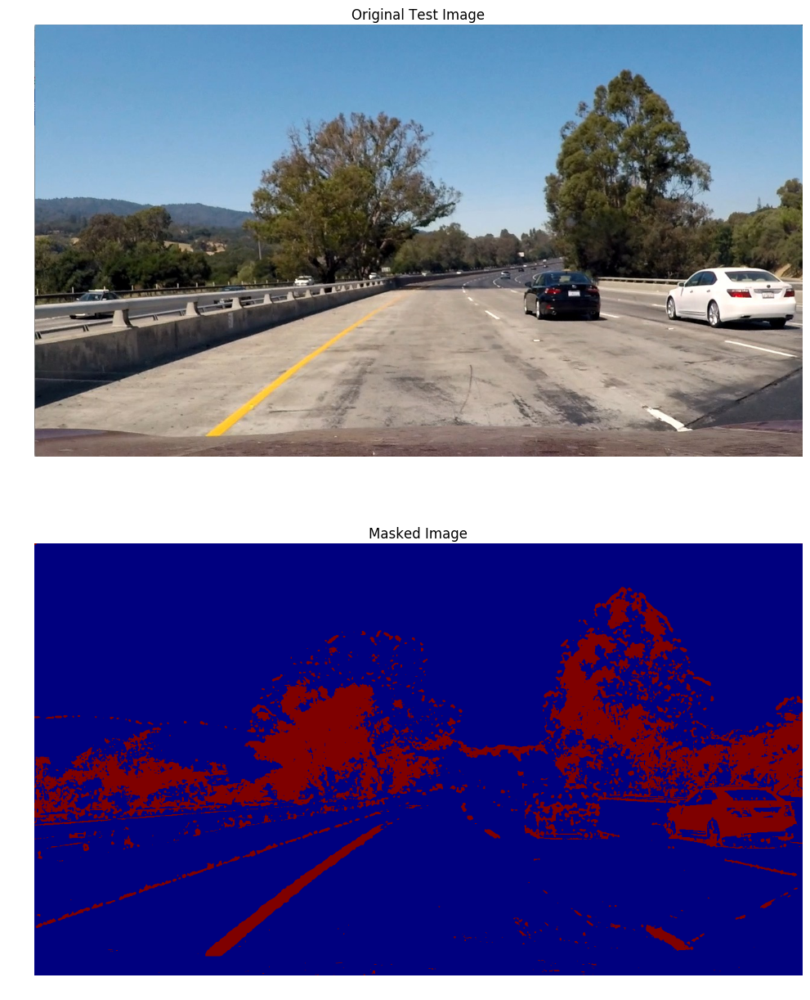

In [8]:
image = mpimg.imread('test_images/test1.jpg')
masked_image = combined_mask(image)

# Plot the two images together to see the transformation
fig, (old, new) = plt.subplots(2, 1, figsize = (38, 15))
old.axis('off')
old.imshow(image)
old.set_title('Original Test Image')
new.axis('off')
new.imshow(masked_image)
new.set_title('Masked Image')

The gradient and color masks applied to the test image appear to do a sufficient job identifying the lane lines and other edges. Some experimentation with the kernel size did not convince me that increasing the kernel size to 5 or 7 would yield significantly better results. The threshold values used for the gradient and color masks were similar to those used in the quizzes. 

Test the gradient and color masks on the undistorted test images.

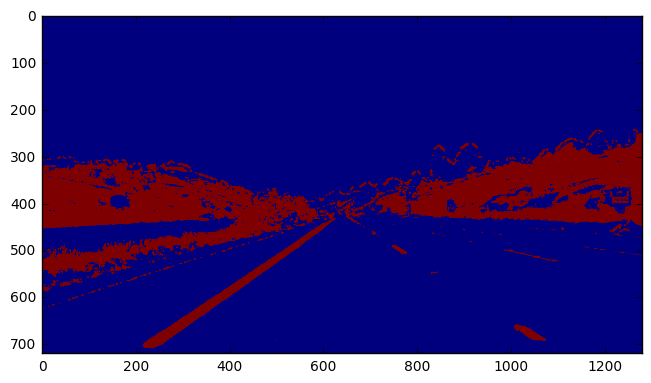

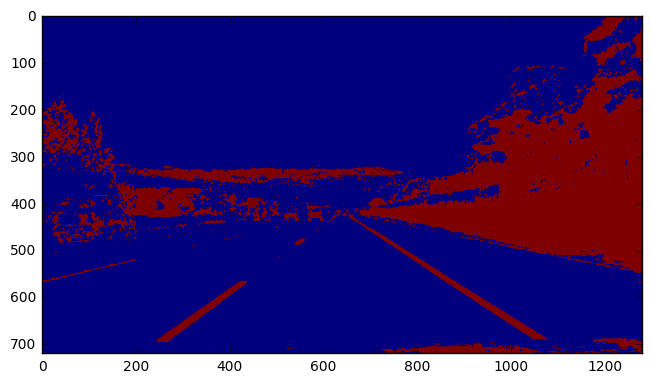

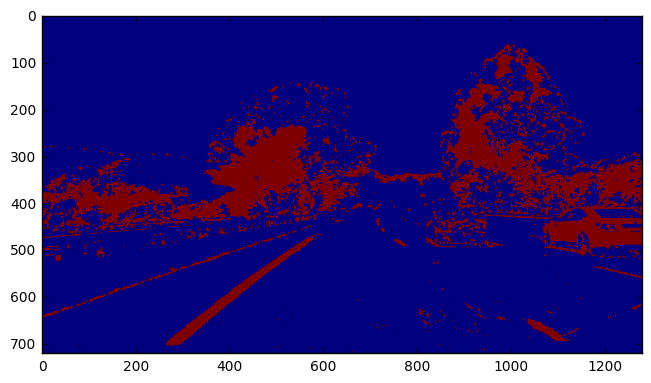

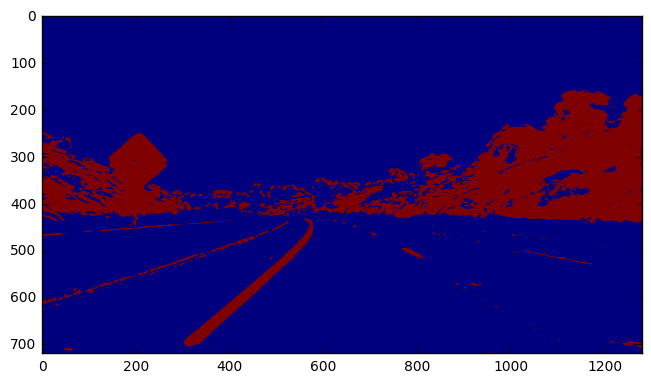

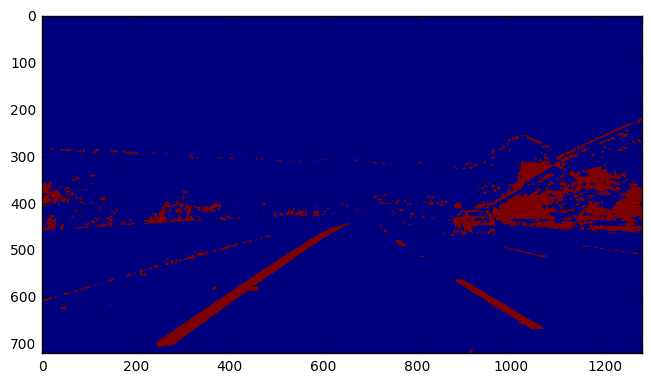

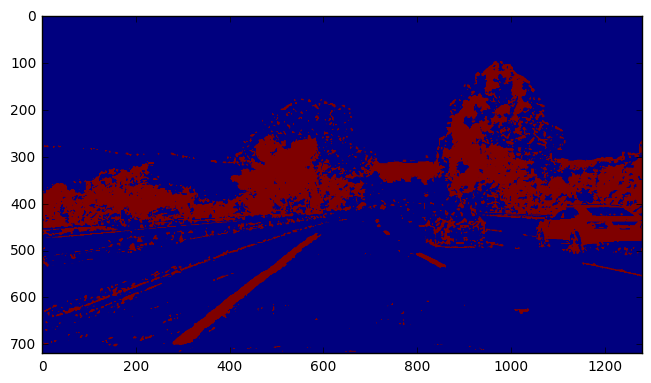

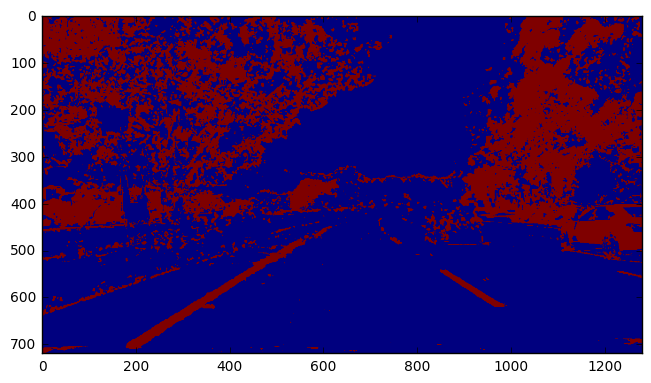

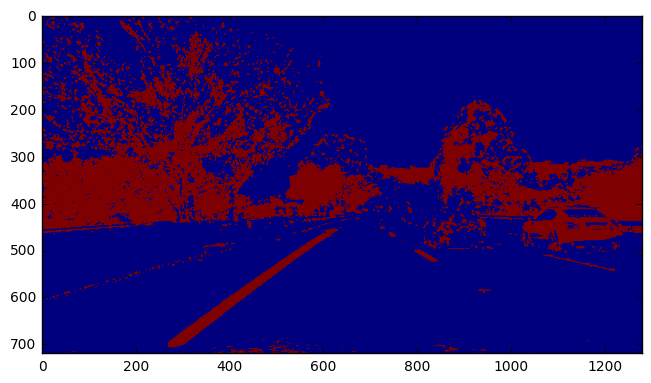

In [9]:
for image_name in glob.glob('test_images/*.jpg'):
    calibrated = calibrate_and_undistort(mpimg.imread(image_name), objpoints, imgpoints)
    masked = combined_mask(calibrated)
    plt.imshow(masked)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

### Perspective Transform 

A perspective transform maps the points in a given image to different, desired, image points with a new perspective. For this project, and with self-driving technology in general, we are most interested in a birds-eye, plan view transform. This will be useful for determine the curvature of the lane lines later on.

In [16]:
def perspective_transform(image):
    """
    This function transforms the input image by mapping image points from the
    camera to a birds eye, plan view.
    
    Parameters
    ----------
    image        : input image to transform
    
    Return
    ------
    warped       : warped image
    """
    offset = 100.
    # get height and width of image
    h, w = image.shape[0], image.shape[1]
    
    # specify source coordinates
    # the height coefficient is very sensitive. <.625 and the transform is not
    # rotated far enough (i.e. looks almost undistorted as you approach 0). 
    # >.625 and the image is rotated to far.
    src = np.float32([[w // 2 - offset, h * .635], [w // 2 + offset, h * .635], [-offset, h], [w + offset, h]])
    
    # specify destination coordinates
    dst = np.float32([[offset, 0], [w - offset, 0], [offset, h], [w - offset, h]])
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(image, M, (w, h), flags=cv2.INTER_LINEAR)
    
    return warped, M, Minv

Visualize the perspective transform on an image with straight lines.

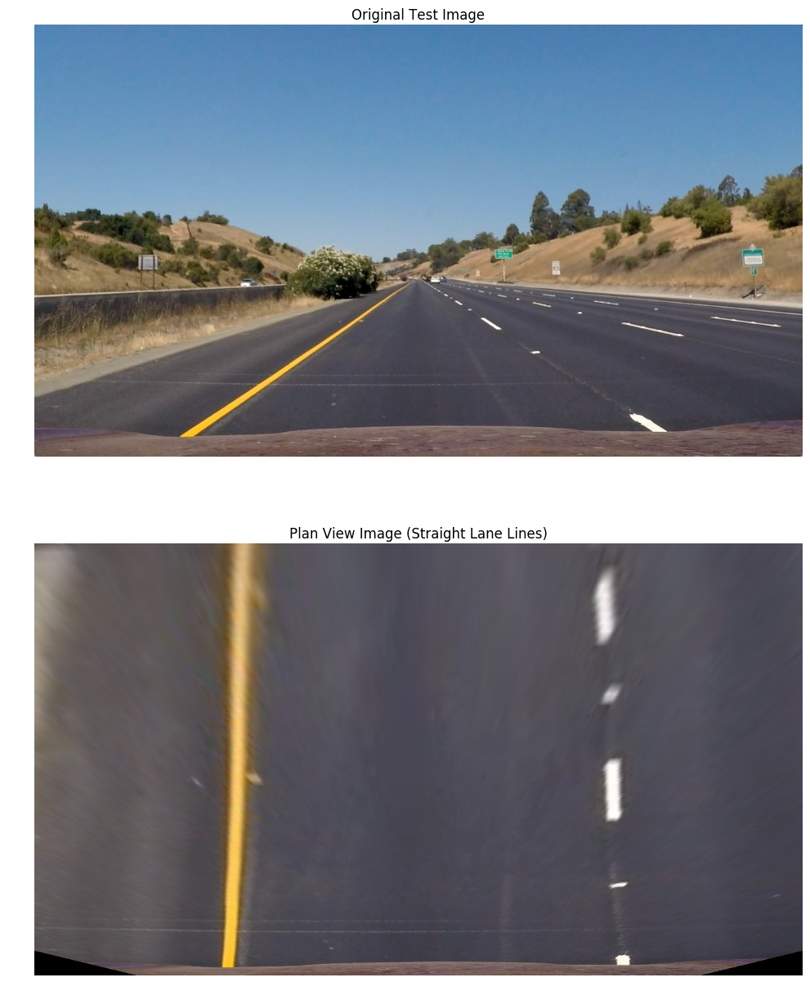

In [17]:
image = mpimg.imread('test_images/straight_lines1.jpg')
warped, M, Minv = perspective_transform(image)

# Plot the two images together to see the transformation
fig, (old, new) = plt.subplots(2, 1, figsize = (38, 15))
old.axis('off')
old.imshow(image)
old.set_title('Original Test Image')
new.axis('off')
new.imshow(warped)
new.set_title('Plan View Image (Straight Lane Lines)')

And visualize the perspective transform on an image with curved lines.

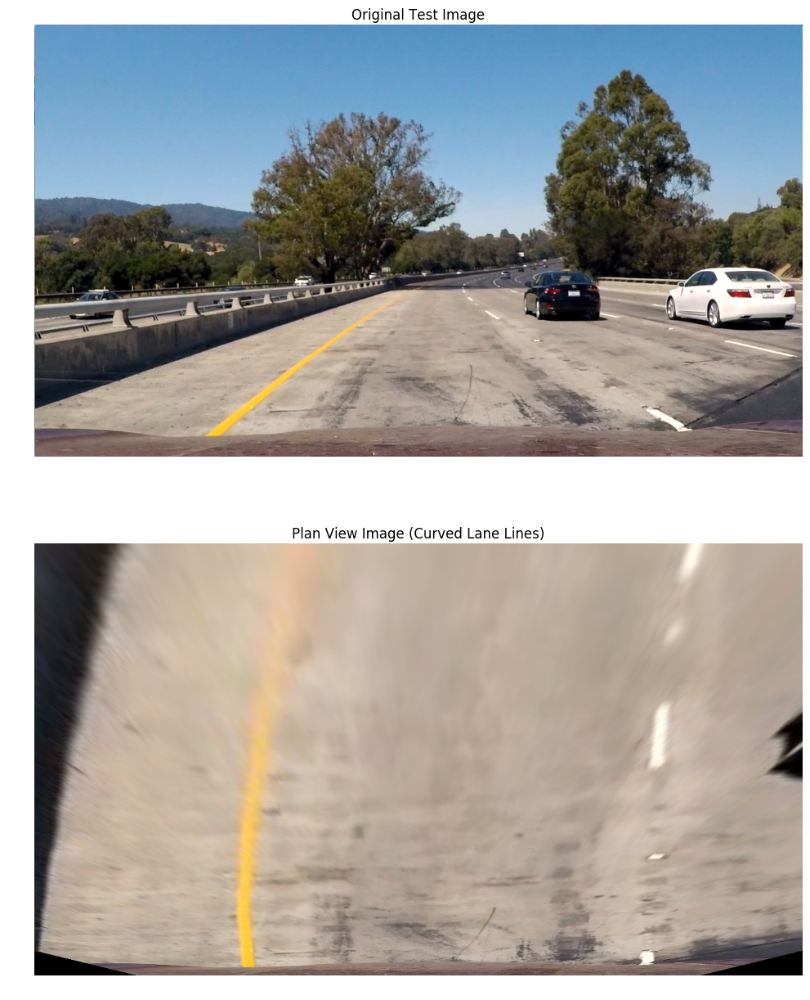

In [18]:
image = mpimg.imread('test_images/test1.jpg')
warped, M, Minv = perspective_transform(image)

# Plot the two images together to see the transformation
fig, (old, new) = plt.subplots(2, 1, figsize = (38, 15))
old.axis('off')
old.imshow(image)
old.set_title('Original Test Image')
new.axis('off')
new.imshow(warped)
new.set_title('Plan View Image (Curved Lane Lines)')

As you can see above, the perspective transform successfully transforms both the straigh line and curved line images. For both, the lines remain approximately the same distance apart and the straight lines remain relatively straight. 

Combine the camera calibration, gradient and color masks, and perspective transform on each test image and visualize. 

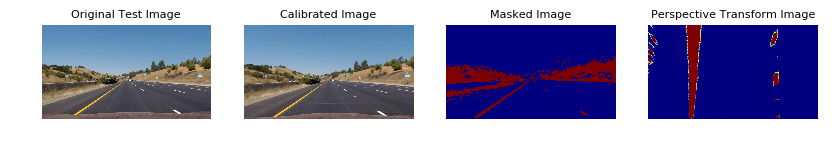

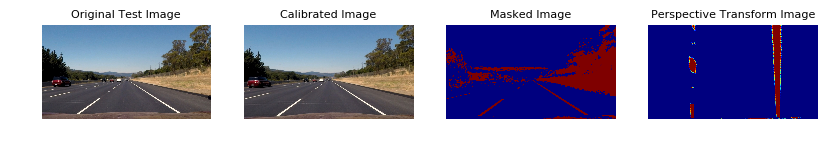

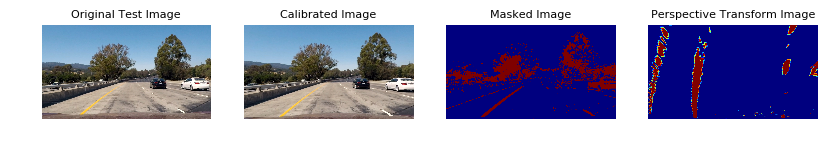

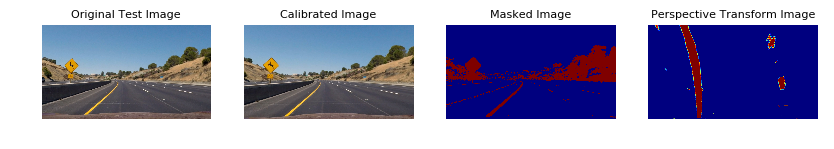

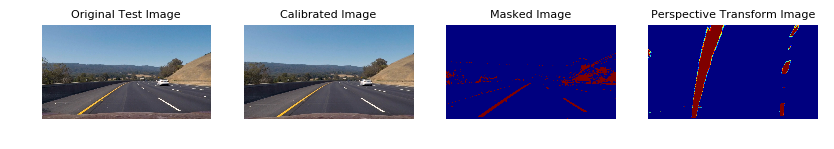

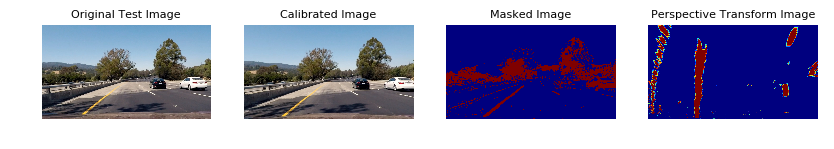

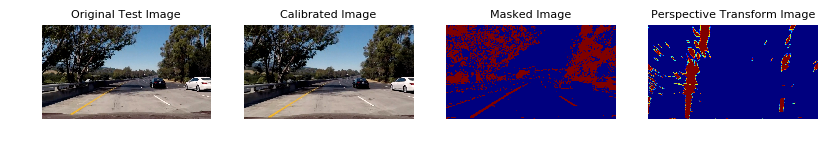

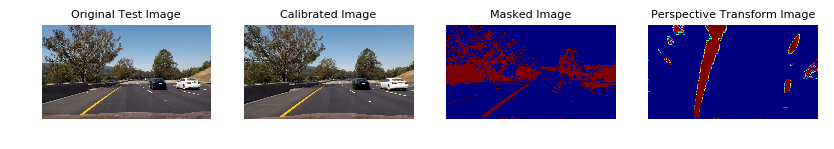

In [19]:
for image_name in glob.glob('test_images/*.jpg'):
    image = mpimg.imread(image_name)
    calibrated = calibrate_and_undistort(mpimg.imread(image_name), objpoints, imgpoints)
    masked = combined_mask(calibrated)
    warped, M, Minv = perspective_transform(masked)
     
    fig, (i, c, m, t) = plt.subplots(1, 4, figsize = (10, 15))
    i.axis('off')
    i.imshow(image)
    i.set_title('Original Test Image', fontsize = 8)
    c.axis('off')
    c.imshow(calibrated)
    c.set_title('Calibrated Image', fontsize = 8)
    m.axis('off')
    m.imshow(masked)
    m.set_title('Masked Image', fontsize = 8)
    t.axis('off')
    t.imshow(warped)
    t.set_title('Perspective Transform Image', fontsize = 8)

### Lane Line Tracking

For this project, I thought the most efficient method for lane line finding and tracking would be to implement the method shown in the classroom. The functions below basically implement sliding windows and fitting polynomials to the lane lines as they were presented in the classroom.

In [20]:
def find_lines(binary_warped):
    """
    Takes a warped, binary image and outputs the left and right line
    pixel positions.
    
    Parameters
    ---------- 
    binary_warped                   : binary, warped image to find lane lines on
    
    Return
    ------
    leftx, lefty, rightx, righty    : left and right x,y pixel positions
    """
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty

def find_lines_post(binary_warped, left_fit, right_fit):
    """
    Same as find_lines(), however since the the position of the lane lines
    are known it is not necessary to blindly search for the lines again. A
    search within the specified margin is used instead.
    """
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty

Check to make sure find_lines() works correctly and returns reasonable data. 

In [21]:
image = mpimg.imread('test_images/test1.jpg')
calibrated = calibrate_and_undistort(image, objpoints, imgpoints)
masked = combined_mask(calibrated)
warped, M, Minv = perspective_transform(masked)

print('Output...')
find_lines(warped)

Output...


(array([333, 334, 335, ..., 474, 475, 476]),
 array([640, 640, 640, ...,  70,  70,  70]),
 array([1015, 1016,  922, ..., 1072, 1073, 1074]),
 array([648, 648, 649, ...,  79,  79,  79]))

Calculate the radius of curvature and the offset from the center of the lane.

In [22]:
def polyfit_lines(leftx, lefty, rightx, righty):
    """
    Takes left and right x, y coordinates and fits a curve to each set.
    
    Parameters
    ---------- 
    leftx, lefty, rightx, righty    : left and right x,y pixel positions
    
    Return
    ------
    left_fit, right_fit             : left and right polyfit curve
    """
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    return left_fit, right_fit

In [23]:
def calc_radius(binary_warped, leftx, lefty, rightx, righty):
    """
    Takes left and right x, y coordinates and a binary, warped image and
    calculates the radius of curvature for each line.
    
    Parameters
    ---------- 
    binary_warped                   : binary, warped image
    leftx, lefty, rightx, righty    : left and right x,y pixel positions
    
    Return
    ------
    left_curverad, right_curverad   : left and right radius of curvature
    """
    y_eval = binary_warped.shape[0] - 1
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radius of curvature in meters
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    return left_curverad, right_curverad

def calc_offset(binary_warped, left_fit, right_fit):
    """
    Takes left and right polyfit curves and a binary, warped image and 
    calculates the offset from the center of the lane.
    
    Parameters
    ---------- 
    left_fit, right_fit     : left and right polyfit curves
    
    Return
    ------
    offset                  : distance from the center of the lane
    """
    y_eval = binary_warped.shape[0] - 1
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    bottom_left_x = np.polyval(left_fit, y_eval)
    bottom_right_x = np.polyval(right_fit, y_eval)
    offset = (binary_warped.shape[1]/2 - (bottom_left_x + bottom_right_x)/2) * xm_per_pix
    return offset

Project the lane line positions on to the road and fill.

In [24]:
def overlay_lane(image, binary_warped, Minv, left_fit, right_fit):
    """
    Takes the original image as well as the warped, binary image and projects 
    the calculated lane lines onto the road using cv2.warpPerspective() and
    inverse matrix, Minv.
    
    Parameters
    ---------- 
    image                   : original image
    binary_warped           : warped, binary image
    Minv                    : inverse matrix from cv2.getPerspectiveTransform()
    left_fit, right_fit     : left and right polyfit curves
    
    Return
    ------
    offset                  : distance from the center of the lane
    """
    # Create an image to draw the lines on
    color_warp = np.zeros_like(image).astype(np.uint8)

    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1],image.shape[0])) 
    # Combine the result with the original image
    overlay = cv2.addWeighted(image, 1, newwarp, 0.3, 0)
    return overlay

def overlay_text(overlay, left_curverad, right_curverad, offset):
    """
    Plots the lane lines, filler between the lane lines, left and right
    radius of curvature, and the offset from the center of the lane.
    """
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(overlay, "left line radius: {0:.5g} m".format(left_curverad), (50,50), font, 1, (255,255,255),2,cv2.LINE_AA)
    cv2.putText(overlay, "right line radius: {0:.5g} m".format(right_curverad), (50,100), font, 1, (255,255,255),2,cv2.LINE_AA)

    if offset > 0:
        rel_dir = "right"
    else:
        rel_dir = "left"

    cv2.putText(overlay, "Vehicle is {0:.2g}m {1} of center".format(np.absolute(offset), rel_dir), (50,150), font, 1, (255,255,255),2,cv2.LINE_AA)

    return overlay

Combine everything.

In [25]:
class AdvancedPipeline():
    def __init__(self):
        print("Calibrating...")
        self.objpoints, self.imgpoints = calibrate()
        print("Ready.")
        
        # Init line objects
        self.left_line = Line()
        self.right_line = Line()

        self.left_line.current_fit = None
        self.right_line.current_fit = None

    def pipeline(self, image):
        # Calibrate and undistort the input image.
        undistorted = calibrate_and_undistort(image, self.objpoints, self.imgpoints)

        # Apply the gradient and color masks and transform the perspective.
        masked = combined_mask(undistorted)
        binary_warped, M, Minv = perspective_transform(masked)

        # Get the left and right lane line locations.
        if (self.left_line.current_fit is None) | (self.right_line.current_fit is None):
            # Blind search
            leftx, lefty, rightx, righty = find_lines(binary_warped)
        else:
            # Known lane line positions
            leftx, lefty, rightx, righty = find_lines_post(binary_warped, self.left_line.current_fit, self.right_line.current_fit)
        
        # Determine the polyfit coefficients
        left_fit, right_fit = polyfit_lines(leftx, lefty, rightx, righty)
        self.left_line.update_queue(left_fit)
        self.right_line.update_queue(right_fit)
        
        # Calculate the radius of curvature and offset from the center of the lane
        left_curverad, right_curverad = calc_radius(binary_warped, leftx, lefty, rightx, righty)
        offset = calc_offset(binary_warped, left_fit, right_fit)

        # Overlay the detected lane and text
        overlay = overlay_lane(undistorted, binary_warped, Minv, self.left_line.best_fit, self.right_line.best_fit)
        overlay = overlay_text(overlay, left_curverad, right_curverad, offset)
        return overlay

class Line():
    """
    Used for keeping track of the lane line fit
    """
    def __init__(self):
        # Polynomial coefficients averaged over the last n iterations
        self.best_fit = None

        # Polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]

        # Polynomial coefficients queue
        self.fit_queue = deque([])

    def update_queue(self, value, n=5):
        self.current_fit = value
        self.fit_queue.append(value)
        if len(self.fit_queue) > n:
            self.fit_queue.popleft()
        self.best_fit = np.average(self.fit_queue, axis=0)

Test the full pipeline and make sure overlay is correct.

Calibrating...
Ready.


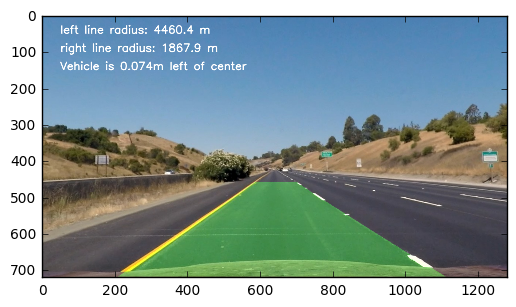

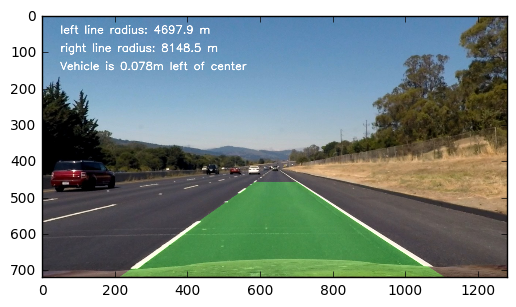

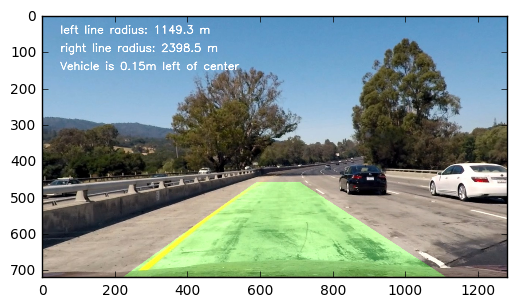

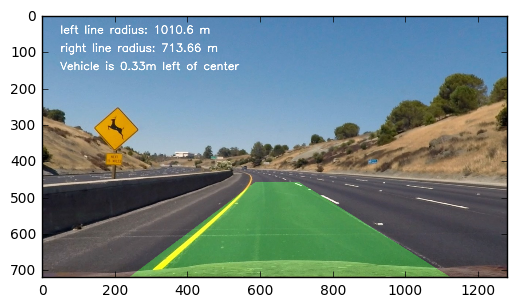

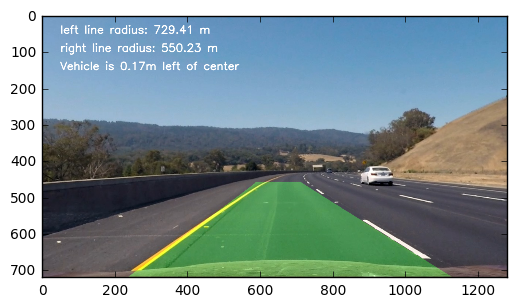

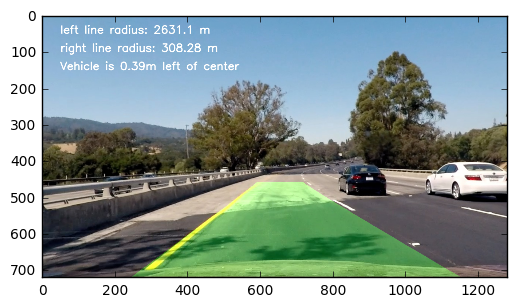

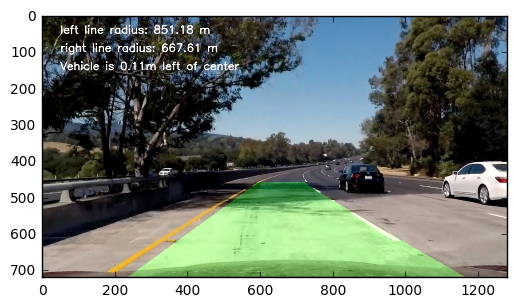

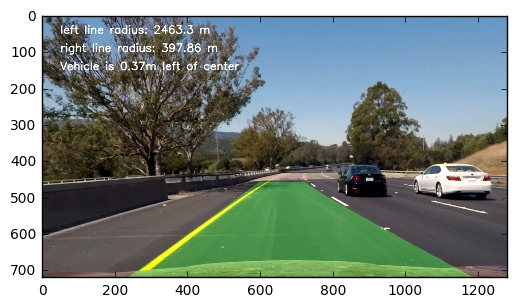

In [29]:
advanced = AdvancedPipeline()

for image in glob.glob('test_images/*.jpg'):
    overlaid = advanced.pipeline(mpimg.imread(image))
    plt.imshow(overlaid)
    plt.show()

### Video Creation

Output the final video.

In [30]:
advanced_pipeline = AdvancedPipeline()
video_output_name = 'P4_Output.mp4'
video = VideoFileClip("project_video.mp4")
video_output = video.fl_image(advanced_pipeline.pipeline)
%time video_output.write_videofile(video_output_name, audio=False)

Calibrating...
Ready.
[MoviePy] >>>> Building video P4_Output.mp4
[MoviePy] Writing video P4_Output.mp4


100%|█████████▉| 1260/1261 [21:52<00:01,  1.10s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: P4_Output.mp4 

CPU times: user 20min 37s, sys: 2min 20s, total: 22min 58s
Wall time: 21min 53s
